In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
from collections import defaultdict

# Load the dataset
def load_dataset(file_path):
    df = pd.read_csv(file_path)
    dataset = [row.strip('[]').split(',') for row in df['Product']]
    dataset = [[item.strip() for item in transaction] for transaction in dataset]
    return dataset

# Step 1: Generate L1 (frequent 1-itemsets)
def generate_L1(item_support, min_support):
    return {frozenset([item]): support for item, support in item_support.items() if support >= min_support}

# Step 2: Generate candidate k-itemsets (Ck) from Lk-1
def generate_candidates(Lk_minus_1, k):
    candidates = set()
    Lk_list = sorted(Lk_minus_1)  # Sort to ensure lexicographic order

    for i in range(len(Lk_list)):
        for j in range(i + 1, len(Lk_list)):
            l1 = list(Lk_list[i])
            l2 = list(Lk_list[j])
            # Join condition
            if l1[:k-2] == l2[:k-2]:
                candidate = frozenset(Lk_list[i] | Lk_list[j])
                candidates.add(candidate)

    print(f"C{k} (Candidates for k={k}): {sorted(map(sorted, candidates))}\n")  # Show candidates in sorted order
    return candidates

# Step 3: Prune step
def prune_candidates(candidates, Lk_minus_1):
    pruned_candidates = set()

    for candidate in candidates:
        is_frequent = True
        for subset in map(frozenset, [set(candidate) - {item} for item in candidate]):
            if subset not in Lk_minus_1:
                is_frequent = False
                break

        if is_frequent:
            pruned_candidates.add(candidate)

    return pruned_candidates

# Step 4: Count support for each candidate k-itemset
def count_support(dataset, candidates):
    support_count = defaultdict(int)

    for transaction in dataset:
        transaction_set = frozenset(transaction)
        for candidate in candidates:
            if candidate.issubset(transaction_set):
                support_count[candidate] += 1

    return support_count

# Step 5: Generate Lk from Ck
def generate_Lk(candidates, support_count, min_support):
    Lk = {candidate: support for candidate, support in support_count.items() if support >= min_support}
    return Lk

# Full Apriori Algorithm
def apriori_algorithm(dataset, min_support):
    item_support = defaultdict(int)
    for transaction in dataset:
        for item in transaction:
            item_support[item] += 1

    # Generate L1
    L1 = generate_L1(item_support, min_support)
    print(f"L1 (Frequent 1-itemsets): {L1}\n")
    # print(f"L1 (Frequent 1-itemsets): {sorted(map(sorted, L1.items()))}\n")

    all_frequent_itemsets = dict(L1)

    Lk = L1
    k = 2

    while Lk:
        candidates = generate_candidates(Lk.keys(), k)
        candidates = prune_candidates(candidates, Lk.keys())
        support_count = count_support(dataset, candidates)
        Lk = generate_Lk(candidates, support_count, min_support)

        all_frequent_itemsets.update(Lk)

        # Print the frequent itemsets for the current k in sorted order
        print(f"L{k} (Frequent {k}-itemsets): {Lk}\n")

        k += 1

    return all_frequent_itemsets

# File path to your CSV dataset
file_path = r'/content/drive/MyDrive/Retail_Transactions_Dataset.csv'

# Load dataset
dataset = load_dataset(file_path)

# Minimum support
min_support = 2

# Run the Apriori algorithm
frequent_itemsets = apriori_algorithm(dataset, min_support)


L1 (Frequent 1-itemsets): {frozenset({"'Hair Gel'"}): 1124, frozenset({"'Tuna'"}): 1151, frozenset({"'Bread'"}): 1093, frozenset({"'Tissues'"}): 1097, frozenset({"'Trash Bags'"}): 1128, frozenset({"'Jam'"}): 1085, frozenset({"'Soap'"}): 1101, frozenset({"'Ketchup'"}): 1096, frozenset({"'BBQ Sauce'"}): 1082, frozenset({"'Hand Sanitizer'"}): 1072, frozenset({"'Extension Cords'"}): 1129, frozenset({"'Ice Cream'"}): 1089, frozenset({"'Shower Gel'"}): 1066, frozenset({"'Baby Wipes'"}): 1084, frozenset({"'Banana'"}): 1093, frozenset({"'Paper Towels'"}): 1072, frozenset({"'Cereal'"}): 1094, frozenset({"'Iron'"}): 1042, frozenset({"'Eggs'"}): 1096, frozenset({"'Pickles'"}): 1134, frozenset({"'Razors'"}): 1100, frozenset({"'Lawn Mower'"}): 1093, frozenset({"'Shrimp'"}): 1106, frozenset({"'Soda'"}): 1149, frozenset({"'Vacuum Cleaner'"}): 1022, frozenset({"'Mayonnaise'"}): 1057, frozenset({"'Ironing Board'"}): 1148, frozenset({"'Laundry Detergent'"}): 1106, frozenset({"'Deodorant'"}): 1152, froze

In [ ]:
import pandas as pd
from collections import defaultdict

# Load the dataset
def load_dataset(file_path):
    df = pd.read_csv(file_path)
    dataset = [row.strip('[]').split(',') for row in df['Product']]
    dataset = [[item.strip() for item in transaction] for transaction in dataset]
    return dataset

# Step 1: Generate L1 (frequent 1-itemsets)
def generate_L1(item_support, min_support):
    return {frozenset([item]): support for item, support in item_support.items() if support >= min_support}

# Step 2: Generate candidate k-itemsets (Ck) from Lk-1
def generate_candidates(Lk_minus_1, k):
    candidates = set()
    Lk_list = sorted(Lk_minus_1)  # Sort to ensure lexicographic order

    for i in range(len(Lk_list)):
        for j in range(i + 1, len(Lk_list)):
            l1 = list(Lk_list[i])
            l2 = list(Lk_list[j])
            # Join condition
            if l1[:k-2] == l2[:k-2]:
                candidate = frozenset(Lk_list[i] | Lk_list[j])
                candidates.add(candidate)

    return candidates

# Step 3: Prune step
def prune_candidates(candidates, Lk_minus_1):
    pruned_candidates = set()
    for candidate in candidates:
        is_frequent = True
        for subset in map(frozenset, [set(candidate) - {item} for item in candidate]):
            if subset not in Lk_minus_1:
                is_frequent = False
                break
        if is_frequent:
            pruned_candidates.add(candidate)
    return pruned_candidates

# Step 4: Count support for each candidate k-itemset
def count_support(dataset, candidates):
    support_count = defaultdict(int)
    for transaction in dataset:
        transaction_set = frozenset(transaction)
        for candidate in candidates:
            if candidate.issubset(transaction_set):
                support_count[candidate] += 1
    return support_count

# Step 5: Generate Lk from Ck
def generate_Lk(candidates, support_count, min_support):
    Lk = {candidate: support for candidate, support in support_count.items() if support >= min_support}
    return Lk

# Convert frozenset to a more readable format
def readable_format(itemset_dict):
    return {', '.join(list(itemset)): support for itemset, support in itemset_dict.items()}

# Full Apriori Algorithm
def apriori_algorithm(dataset, min_support):
    item_support = defaultdict(int)
    for transaction in dataset:
        for item in transaction:
            item_support[item] += 1

    # Generate L1
    L1 = generate_L1(item_support, min_support)
    print(f"L1 (Frequent 1-itemsets) for min_support={min_support}: {readable_format(L1)}\n")
    print(f"Number of frequent itemsets in L1: {len(L1)}\n")

    Lk = L1
    k = 2

    while Lk:
        candidates = generate_candidates(Lk.keys(), k)
        print(f"C{k} (Candidate {k}-itemsets): {sorted(map(list, candidates))}\n")  # Show candidates as list

        candidates = prune_candidates(candidates, Lk.keys())
        support_count = count_support(dataset, candidates)
        Lk = generate_Lk(candidates, support_count, min_support)

        print(f"L{k} (Frequent {k}-itemsets): {readable_format(Lk)}\n")  # Show frequent itemsets in readable format
        print(f"Number of frequent itemsets in L{k}: {len(Lk)}\n")

        k += 1

# Find optimal min_support
def find_optimal_min_support(dataset):
    results = []

    # Test min_support values from 1 to 10
    for min_support in range(2, 11):
        print(f"\n min_support = {min_support}\n ------------------------------------------------------------------- \n")
        apriori_algorithm(dataset, min_support)

# File path to your CSV dataset
file_path = r'/content/drive/MyDrive/Retail_Transactions_Dataset.csv'

# Load dataset
dataset = load_dataset(file_path)

# Find the optimal min_support
find_optimal_min_support(dataset)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import matplotlib.pyplot as plt

# Results for each min support value
min_support_values = list(range(2, 11))
L1_counts = [81] * 9  # L1 is constant for all min_support values
L2_counts = [3240] * 9  # L2 is constant for all min_support values
L3_counts = [22203, 6754, 1717, 381, 74, 13, 2, 0, 0]
L4_counts = [302, 4, 0, 0, 0, 0, 0, 0, 0]
L5_counts = [0] * 9  # L5 is zero for all min_support values

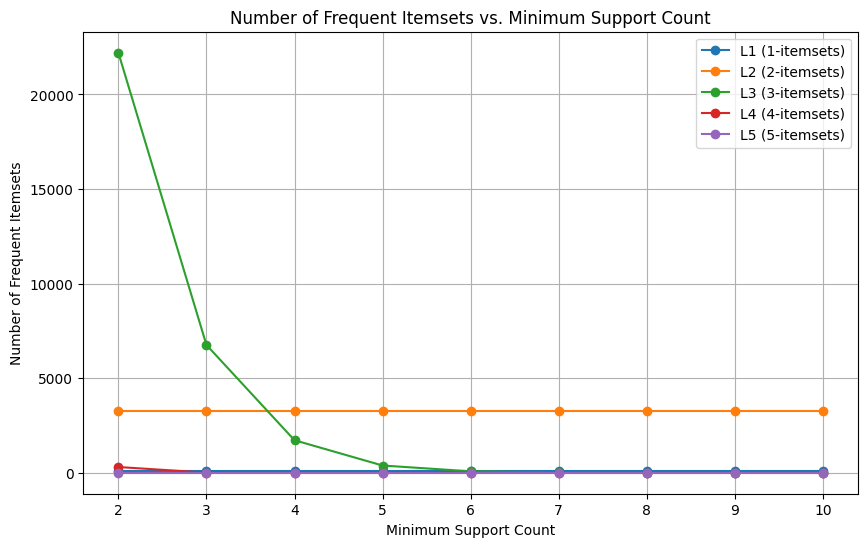

In [ ]:
import matplotlib.pyplot as plt

# Plot the data
plt.figure(figsize=(10, 6))

# Plot for each pattern (L1, L2, L3, etc.)
plt.plot(min_support_values, L1_counts, marker='o', label='L1 (1-itemsets)')
plt.plot(min_support_values, L2_counts, marker='o', label='L2 (2-itemsets)')
plt.plot(min_support_values, L3_counts, marker='o', label='L3 (3-itemsets)')
plt.plot(min_support_values, L4_counts, marker='o', label='L4 (4-itemsets)')
plt.plot(min_support_values, L5_counts, marker='o', label='L5 (5-itemsets)')

# Add titles and labels
plt.title('Number of Frequent Itemsets vs. Minimum Support Count')
plt.xlabel('Minimum Support Count')
plt.ylabel('Number of Frequent Itemsets')
plt.xticks(min_support_values)  # Display each min support value on x-axis
plt.legend()  # Show the legend
plt.grid()

# Show the plot
plt.show()
